### Made by 

 --- 

 Simone Mingels (i6257567) and Sanne Vergouwen (i6270885)

# Introduction

## Research question

- What factor affects the vaccination rate of a country? i.e: GDP, Population, etc.

### Sub questions

- What countries have the highest / lowest vaccination rate?
- What countries have the highest / lowest GDP?

# Start of the analysis

We first import the necessary libraries and load the data.

In [ ]:
pip install ipympl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%matplotlib inline
import altair as alt
import pandas as pd
import ipywidgets as widgets
from ipywidgets import AppLayout, interact
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go

In [ ]:
def greet(Welcome):
  return f'Hello {Welcome}!'

In [ ]:
interact(greet, Welcome ='Fill in your name');

interactive(children=(Text(value='Fill in your name', description='Welcome'), Output()), _dom_classes=('widget…

In [ ]:
Date_picker = widgets.DatePicker(
    description='Pick a date'
)
Date_picker

DatePicker(value=None, description='Pick a date')

In [ ]:
print('The date filled in is:  ')
Date_picker.value

The date filled in is:  


# Read in the data

We read in the csv file we downloaded from the assignment.

In [ ]:
df = pd.read_csv("https://covid.ourworldindata.org/data/owid-covid-data.csv", parse_dates=['date'])

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


We first look at all the columns to give us an idea of what we are working with.

In [ ]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

After looking at these columns we can see that there are some intresting columns that we can use to start looking at our research question. these columns are the following:

- location
- date
- total_cases
- new_cases_smoothed
- total_cases_per_million
- new_cases_per_million
- new_cases_smoothed_per_million
- total_tests
- new_tests
- total_tests_per_thousand
- new_tests_per_thousand
- new_tests_smoothed
- new_tests_smoothed_per_thousand
- positive_rate
- tests_per_case
- tests_units
- total_vaccinations
- people_vaccinated
- people_fully_vaccinated
- total_boosters
- new_vaccinations
- new_vaccinations_smoothed
- total_vaccinations_per_hundred
- people_vaccinated_per_hundred
- people_fully_vaccinated_per_hundred
- total_boosters_per_hundred
- new_vaccinations_smoothed_per_million
- new_people_vaccinated_smoothed
- new_people_vaccinated_smoothed_per_hundred
- gdp_per_capita 
- extreme_poverty 
- human_development_index 
- population

In [ ]:
keep_fields = [
    "iso_code",
    "location", 
    "date", 
    "total_cases", 
    "new_cases_smoothed",  
    "total_cases_per_million", 
    "new_cases_per_million", 
    "new_cases_smoothed_per_million", 
    "total_tests", 
    "new_tests", 
    "total_tests_per_thousand", 
    "new_tests_per_thousand", 
    "new_tests_smoothed", 
    "new_tests_smoothed_per_thousand", 
    "positive_rate", 
    "tests_per_case", 
    "tests_units", 
    "total_vaccinations", 
    "people_vaccinated", 
    "people_fully_vaccinated", 
    "total_boosters", 
    "new_vaccinations", 
    "new_vaccinations_smoothed", 
    "total_vaccinations_per_hundred", 
    "people_vaccinated_per_hundred",
    "people_fully_vaccinated_per_hundred",
     "total_boosters_per_hundred", 
     "new_vaccinations_smoothed_per_million", 
     "new_people_vaccinated_smoothed", 
     "new_people_vaccinated_smoothed_per_hundred", 
     "gdp_per_capita", 
     "extreme_poverty", 
     "human_development_index",
     "population"
]

df = df[keep_fields]

## Missing values

Now, there are a lot of columns, but it is also important to see how many missing values there are in each column. This is important because we want to make sure that we are not using columns that have a lot of missing values to make sure our analysis is not biased or invalid.

Since we are looking at GDP being a factor, we can also hypothesize that the countries that have the highest GDP will also have better reporting of their data. This is because they have more resources to do so. See section ...

In [ ]:
len(df)

262192

In [ ]:
df.isna().sum().sort_values(ascending=False)

total_boosters_per_hundred                    220925
total_boosters                                220925
new_vaccinations                              202236
people_fully_vaccinated_per_hundred           195090
people_fully_vaccinated                       195090
people_vaccinated                             192759
people_vaccinated_per_hundred                 192759
total_vaccinations                            189659
total_vaccinations_per_hundred                189659
new_tests                                     186789
new_tests_per_thousand                        186789
total_tests                                   182805
total_tests_per_thousand                      182805
tests_per_case                                167844
positive_rate                                 166265
new_tests_smoothed_per_thousand               158227
new_tests_smoothed                            158227
tests_units                                   155404
extreme_poverty                               

we can see that there are a lot of missing values, so we will drop the columns that have more than 50% missing values. A bit of a subjective number, but we have the feeling that this will make our analysis more accurate.

In [ ]:
df.isna().sum().sort_values(ascending=False) / len(df)

total_boosters_per_hundred                    0.842608
total_boosters                                0.842608
new_vaccinations                              0.771328
people_fully_vaccinated_per_hundred           0.744073
people_fully_vaccinated                       0.744073
people_vaccinated                             0.735183
people_vaccinated_per_hundred                 0.735183
total_vaccinations                            0.723359
total_vaccinations_per_hundred                0.723359
new_tests                                     0.712413
new_tests_per_thousand                        0.712413
total_tests                                   0.697218
total_tests_per_thousand                      0.697218
tests_per_case                                0.640157
positive_rate                                 0.634135
new_tests_smoothed_per_thousand               0.603478
new_tests_smoothed                            0.603478
tests_units                                   0.592711
extreme_po

In [ ]:
x = df.isna().sum().sort_values(ascending=False) / len(df)
x = x[x > 0.5].index
df = df.drop(x, axis=1)

In [ ]:
df.isna().sum().sort_values(ascending=False) / len(df)

extreme_poverty                               0.475804
new_people_vaccinated_smoothed                0.398548
new_people_vaccinated_smoothed_per_hundred    0.398548
new_vaccinations_smoothed                     0.398246
new_vaccinations_smoothed_per_million         0.398246
human_development_index                       0.214175
gdp_per_capita                                0.194781
new_cases_smoothed_per_million                0.065666
new_cases_smoothed                            0.061398
new_cases_per_million                         0.061093
total_cases_per_million                       0.059773
total_cases                                   0.055486
population                                    0.004287
iso_code                                      0.000000
location                                      0.000000
date                                          0.000000
dtype: float64

We should move this down still after GDP clusters are made

There is not enough data available concerning the testing, so we won't continue this topic within our research

# Looking at the data

Now that we have cleaned up the data a bit, we can start looking at the data.

Here we can see that the data is grouped by country basis and that the data is sorted by date. To give us a better idea we will look at the countries with the highest cases.

<AxesSubplot:xlabel='location'>

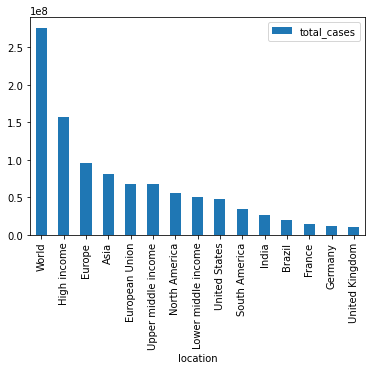

In [ ]:
df.groupby('location').mean(numeric_only=True).sort_values(by='total_cases', ascending=False).head(15).plot(kind='bar', y='total_cases')

In [ ]:
df = df[~df['location'].isin(['World', 'Asia', 'Europe', 'North America', 'South America', 'Africa', 'Oceania', 'European Union'])]

here we can see something dangerous, some locations are not countries, but groups of countries, like (world, high incone, Upper middle income, lower middle income, Low income)

<AxesSubplot:xlabel='location'>

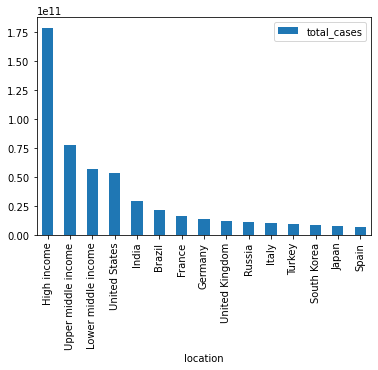

In [ ]:
df.groupby('location').sum(numeric_only=True).sort_values(by='total_cases', ascending=False).head(15).plot(kind='bar', y='total_cases')

Since these groups are available we could 

In [ ]:
grouped_df = df[df.location.isin(['World', 'High income', 'Upper middle income', 'Lower middle income', 'Low income'])].reset_index()


<AxesSubplot:xlabel='location'>

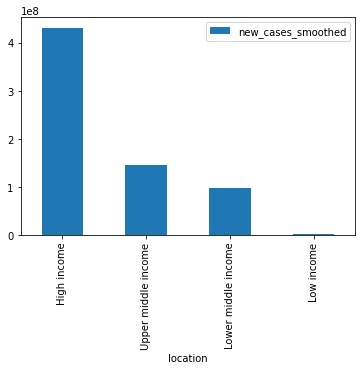

In [ ]:
grouped_df.groupby('location').sum(numeric_only=True).sort_values(by='new_cases_smoothed', ascending=False).plot(kind='bar', y='new_cases_smoothed')

# GDP clusteren 

Usually they use GNI (gross national income) in order to calculate the income level of a country. However this information is not available within the given database, so we take the second best way to classify it, by using the GDP (Gross domestic product). The higher the GDP, the higher income the country, which can also indicate a higher standard of living.

[source](https://en.wikipedia.org/wiki/Gross_domestic_product#/media/File:Map_of_countries_by_GDP_\(nominal\)_per_capita_in_2022.svg)

Because GDP had some missing values this means there are also some countries we dont have any GDP data on.

In [ ]:
df.gdp_per_capita

0         1803.987
1         1803.987
2         1803.987
3         1803.987
4         1803.987
            ...   
262187    1899.775
262188    1899.775
262189    1899.775
262190    1899.775
262191    1899.775
Name: gdp_per_capita, Length: 253130, dtype: float64

In [ ]:
max_gdp = df['gdp_per_capita'].max()
df['test_income_class'] = pd.cut(df['gdp_per_capita'], bins=[0, 2500, 20_000, 40_000, max_gdp], labels=['low income', 'lower middle income', 'upper middle income', 'high income'])
df["test_income_class"] = pd.cut(df['gdp_per_capita'], bins=[0, 2500, 20_000, 40_000, max_gdp], labels=['low income', 'lower middle income', 'upper middle income', 'high income'])
df['test_income_class'] = df['test_income_class'].cat.add_categories('unknown')
df['test_income_class'] = df['test_income_class'].fillna('unknown')

In [ ]:
df[['location', 'test_income_class']].groupby('location').first()

,test_income_class
location,
Afghanistan,low income
Albania,lower middle income
Algeria,lower middle income
Andorra,unknown
Angola,lower middle income
...,...
Wallis and Futuna,unknown
Western Sahara,unknown
Yemen,low income


<Figure size 1440x1440 with 0 Axes>

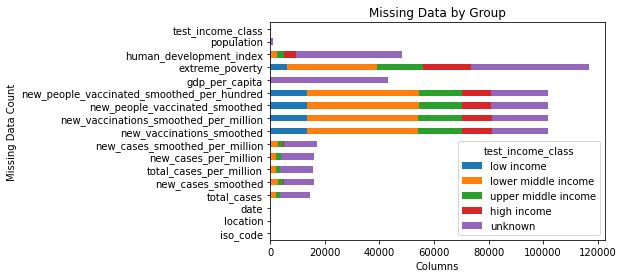

In [ ]:
plt.figure(figsize=(20,20))
missing_counts = df.isnull().groupby(df['test_income_class']).sum()

# Transpose the new dataframe
missing_counts = missing_counts.T

# Create a stacked bar chart of the missing counts by income_class
missing_counts.plot(kind='barh', stacked=True)

# Add axis labels and a title
plt.xlabel('Columns')
plt.ylabel('Missing Data Count')
plt.title('Missing Data by Group')
plt.show()

# Five categories have been made


In [ ]:
category = 'unknown'
df[df['test_income_class'] == category].groupby('location').first().index

Index(['Andorra', 'Anguilla', 'Bonaire Sint Eustatius and Saba',
       'British Virgin Islands', 'Cook Islands', 'Cuba', 'Curacao', 'England',
       'Faeroe Islands', 'Falkland Islands', 'French Polynesia', 'Gibraltar',
       'Greenland', 'Guam', 'Guernsey', 'High income', 'International',
       'Isle of Man', 'Jersey', 'Liechtenstein', 'Low income',
       'Lower middle income', 'Monaco', 'Montserrat', 'New Caledonia', 'Niue',
       'North Korea', 'Northern Cyprus', 'Northern Ireland',
       'Northern Mariana Islands', 'Pitcairn', 'Saint Helena',
       'Saint Pierre and Miquelon', 'Scotland', 'Somalia', 'Syria', 'Taiwan',
       'Tokelau', 'Turks and Caicos Islands', 'United States Virgin Islands',
       'Upper middle income', 'Vatican', 'Wales', 'Wallis and Futuna',
       'Western Sahara'],
      dtype='object', name='location')

<AxesSubplot:xlabel='test_income_class'>

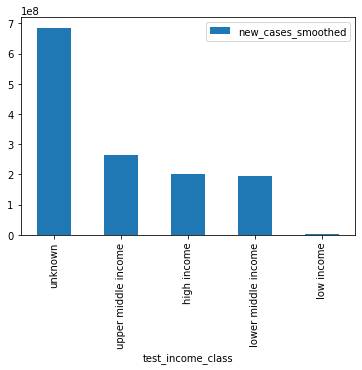

In [ ]:
df.groupby('test_income_class').sum(numeric_only=True).sort_values(by='new_cases_smoothed', ascending=False).head(15).plot(kind='bar', y='new_cases_smoothed')

# GDP + vaccine

Now we are going to see if there are some intresting insights linked to GDP and vaccinations

<AxesSubplot:xlabel='location'>

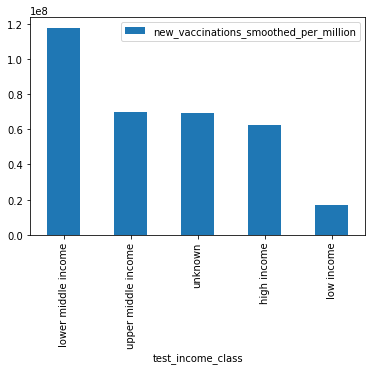

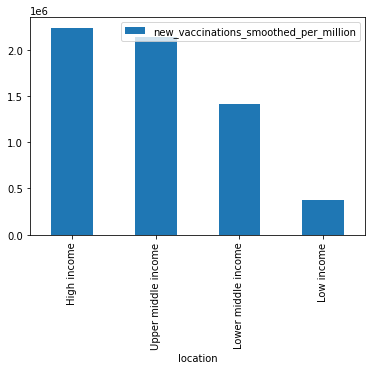

In [ ]:
df.groupby('test_income_class').sum(numeric_only=True).sort_values(by='new_vaccinations_smoothed_per_million', ascending=False).plot(kind='bar', y='new_vaccinations_smoothed_per_million')
grouped_df.groupby('location').sum(numeric_only=True).sort_values(by='new_vaccinations_smoothed_per_million', ascending=False).plot(kind='bar', y='new_vaccinations_smoothed_per_million')

Here we have some intresting insights, the results of the `test_income_class` and the income classes from the `location` have different results. not only do the groups from the location have higher numbers, but the distribution is also different.

This looks to be the cause of the unkown group

In [ ]:
widgets.Dropdown(
    options=df["location"].unique().tolist(),
    description='Country:'
)

Dropdown(description='Country:', options=('Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Anguilla'…

In [ ]:
df.columns

Index(['iso_code', 'location', 'date', 'total_cases', 'new_cases_smoothed',
       'total_cases_per_million', 'new_cases_per_million',
       'new_cases_smoothed_per_million', 'new_vaccinations_smoothed',
       'new_vaccinations_smoothed_per_million',
       'new_people_vaccinated_smoothed',
       'new_people_vaccinated_smoothed_per_hundred', 'gdp_per_capita',
       'extreme_poverty', 'human_development_index', 'population',
       'test_income_class'],
      dtype='object')

<AxesSubplot:xlabel='date'>

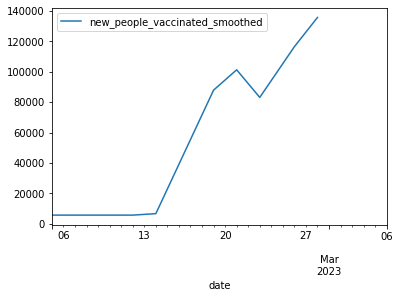

In [ ]:
df[df["location"] == "Afghanistan"].sort_values(by='date').tail(30).plot(kind='line', y='new_people_vaccinated_smoothed', x='date')

In [ ]:
 import matplotlib.pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact, fixed
import datetime

# Define a function to plot the data for a selected country
def plot_country_data(df, country, start_date, end_date):
    if start_date is None:
        start_date = df["date"].tail(32).values[0]
    if end_date is None:
        end_date = df["date"].tail(1).values[0]

    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    
    country_data = df[(df["location"] == country)]
    country_data = country_data[(country_data["date"] >= start_date) & (country_data["date"] <= end_date)]
    country_data.plot(kind='line', y='new_people_vaccinated_smoothed', x='date')
    # set the date on the x-axis to be dd-mm-yyyy
    
    plt.title(f"New Vaccinations in {country}")
    plt.xlabel("Date")
    plt.ylabel("New Vaccinations")
    plt.show()

# Create the dropdown widget for selecting a country
country_dropdown = widgets.Dropdown(
    options=df["location"].unique().tolist(),
    description='Country:'
)


date_start = widgets.DatePicker(
    description='Start Date'
)

date_end = widgets.DatePicker(
    description='End Date'
)


# Use the interact function to update the plot when a new country is selected
interact(plot_country_data, df=fixed(df), country=country_dropdown, start_date=date_start, end_date=date_end)

interactive(children=(Dropdown(description='Country:', options=('Afghanistan', 'Albania', 'Algeria', 'Andorra'…

<function __main__.plot_country_data(df, country, start_date, end_date)>

# Verschillende dingen proberen met database


In [ ]:
date_df = df.sort_values(by='date')
alt.Chart(date_df.head(3000)).mark_point().encode(
    x='date',
    y='mean(new_cases_smoothed)',
    color= 'test_income_class',
    tooltip = [ 'date', 'new_cases_smoothed', 'test_income_class' ],
    size = 'new_cases_smoothed',
)

alt.Chart(...)

In [ ]:
alt.Chart(date_df.head(3000)).mark_line().encode(
    x='date:T',
    y='new_cases_per_million',
    color='test_income_class'
).interactive()

alt.Chart(...)

# Total cases: 3 verschillende scenario's

1) Hieronder zijn de total cases weergegeven van alle locations. Opletten dat hier wel de 'rare' variabelen, zoals Africa, World, etc. eruit zijn, maar de variabelen als upper income etc er wel nog inzitten...

In [ ]:
alt.Chart(date_df.head(5000)).mark_area().encode(
    x='date:T',
    y='total_cases',
    color='location',
    tooltip=['date:T', 'total_cases', 'location']
).interactive().properties(title='Total cases of every location')

alt.Chart(...)

2) Laten we nu kijken per gemaakte GDP categorie hoeveel nieuwe cases er zijn

In [ ]:
alt.Chart(date_df.head(5000)).mark_area().encode(
    x='date:T',
    y='total_cases',
    color='gdp_per_capita',
    tooltip=['date:T', 'total_cases', 'gdp_per_capita']
).interactive().properties(title='Total cases of categorised by GDP')

alt.Chart(...)

3) Laten we nu kijken naar onze eigen gemaakt categorieën en de nieuwe cases. Dit is geen succes, kijk maar naar grafiek...

# Vaccinatiegraad berekenen
https://www.vzinfo.nl/bronnen-methoden-en-achtergronden/vaccinatie-vraag-en-antwoord#berekening 

In [ ]:
df['vaccination_rate'] = (df['new_people_vaccinated_smoothed']/df['population'])*100



In [ ]:
df[['location', 'vaccination_rate']].groupby('location').first()

,vaccination_rate
location,
Afghanistan,0.003324
Albania,0.002252
Algeria,0.000067
Andorra,0.082662
Angola,0.002475
...,...
Wallis and Futuna,2.345636
Western Sahara,NaN
Yemen,0.012690


In [ ]:
df.loc[:,"vaccination_rate"]

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
          ..
262187   NaN
262188   NaN
262189   NaN
262190   NaN
262191   NaN
Name: vaccination_rate, Length: 253130, dtype: float64

In [ ]:
def select_country_data(location, df):
  return df.loc[df['location'] == location, ]

def visualize_country_data(location, df):
  country_data = select_country_data(location, df)

  chart = alt.Chart(country_data).mark_line().encode(
    x='yearmonth(date):T',
    y='vaccination_rate',
    tooltip = 'location'
)
  display(chart)
  
visualize_country_data('Netherlands', df)

alt.Chart(...)

In [ ]:
interact(visualize_country_data, location=df['location'].unique(), df = df);

interactive(children=(Dropdown(description='location', options=('Afghanistan', 'Albania', 'Algeria', 'Andorra'…